In [2]:
import tensorflow as tf
print(tf.__version__)

2.12.0


In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
root_dir = "/content/drive/My Drive/Tesis/Desarrollo/"
print(root_dir)

Mounted at /content/drive
/content/drive/My Drive/Tesis/Desarrollo/


In [4]:
base_dir = root_dir + 'ColeccionGrande/'
print(base_dir)

/content/drive/My Drive/Tesis/Desarrollo/ColeccionGrande/


In [24]:
import h5py
import numpy as np
#hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')
hf = h5py.File(base_dir + 'DatasetsDesconocidos.hdf5', 'r')

In [25]:
img = np.array(hf.get('Entradas')[0])
img.shape

(256, 256, 4)

In [28]:
import h5py
import numpy as np

#hf = h5py.File(base_dir + 'DatasetsStokes.hdf5', 'r')
#hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')
hf = h5py.File(base_dir + 'DatasetsDesconocidos.hdf5', 'r')

Entradas = np.array(hf.get('Entradas')[8000:10000])
#Entradas = np.array(hf.get('S_test')[2000:2500])
print('Entradas cargado.')

Salidas = np.array(hf.get('Salidas')[8000:10000])
#Salidas = np.array(hf.get('P_test')[2000:2500])
print('Salidas cargado.')

print(Entradas.shape, Salidas.shape)

Entradas cargado.
Salidas cargado.
(2000, 256, 256, 4) (2000, 256, 256)


In [29]:
Salidas = Salidas.reshape((-1, 256, 256, 1))

In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

In [ ]:
img = np.array(hf.get('S_train')[0])

In [ ]:
img.shape

(256, 256, 4)

## **Importar datasets ya construídos:**

In [ ]:
import h5py
import numpy as np
hf = h5py.File(base_dir + 'Datasets256.hdf5', 'r')

S_train = np.array(hf.get('S_train')[8000:10000])
print('S_train cargado.')
S_test = np.array(hf.get('S_test')[2000:2500])
print('S_test cargado.')
P_train = np.array(hf.get('P_train')[8000:10000])
print('P_train cargado.')
P_test = np.array(hf.get('P_test')[2000:2500])
print('P_test cargado.')

print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

RuntimeError: ignored

Exception ignored in: 'h5py._objects.ObjectID.__dealloc__'
Traceback (most recent call last):
  File "h5py/_objects.pyx", line 199, in h5py._objects.ObjectID.__dealloc__
RuntimeError: Can't decrement id ref count (unable to close file, errno = 107, error message = 'Transport endpoint is not connected')


S_train cargado.
S_test cargado.
P_train cargado.
P_test cargado.
(2000, 256, 256, 4) (500, 256, 256, 4) (2000, 256, 256) (500, 256, 256)


In [ ]:
P_train = P_train.reshape((-1, 256, 256, 1))
P_test = P_test.reshape((-1, 256, 256, 1))

In [ ]:
print(S_train.shape, S_test.shape, P_train.shape, P_test.shape)

(2000, 256, 256, 4) (500, 256, 256, 4) (2000, 256, 256, 1) (500, 256, 256, 1)


## **Construcción de la red neuronal tipo GAN**

**Una vez se tienen las entradas(S) y salidas(P) definidas, se realiza el diseño de una arquitectura de red neuronal por medio de Tensorflow:**

In [9]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import concatenate
from keras.layers import UpSampling2D
from keras.layers import Input, Dropout
from tensorflow.keras import Model

In [10]:
from keras.layers import Activation, BatchNormalization, Conv2D, UpSampling2D, Conv2DTranspose, Concatenate
from keras.layers import MaxPooling2D, Dropout, Input, AveragePooling2D, Reshape, Permute, UpSampling2D, LeakyReLU
from keras.layers import SimpleRNN, Bidirectional, LSTM
from keras.layers import Lambda
from keras.models import load_model, Model
from keras.losses import sparse_categorical_crossentropy
import tensorflow as tf
from keras.initializers import RandomNormal
from keras.optimizers import *
import keras.backend as K
import keras
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [11]:
from numpy import zeros
from numpy import ones
from numpy.random import randint

In [12]:
def define_discriminator(in_image_shape, out_image_shape):
  # weight initialization
  init = RandomNormal(stddev=0.02)
  # source image input
  in_src_image = Input(shape=in_image_shape)
  # target image input
  in_target_image = Input(shape=out_image_shape)
  # concatenate images channel-wise
  merged = Concatenate()([in_src_image, in_target_image])
  # C64
  d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
  d = LeakyReLU(alpha=0.2)(d)
  # C128
  d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
  d = BatchNormalization()(d)
  d = LeakyReLU(alpha=0.2)(d)
  # C256
  d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
  d = BatchNormalization()(d)
  d = LeakyReLU(alpha=0.2)(d)
  # C512
  d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
  d = BatchNormalization()(d)
  d = LeakyReLU(alpha=0.2)(d)
  # second last output layer
  d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
  d = BatchNormalization()(d)
  d = LeakyReLU(alpha=0.2)(d)
  # patch output
  d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
  patch_out = Activation('sigmoid')(d)
  # define model
  model = Model([in_src_image, in_target_image], patch_out)
  # compile model
  opt = Adam()
  model.compile(loss='binary_crossentropy', optimizer=opt)
  return model

/usr/local/lib/python3.10/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


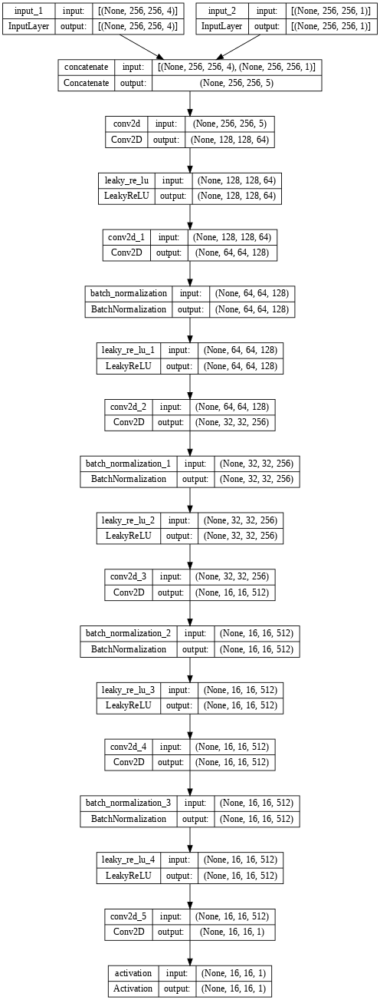

In [13]:
in_image_shape, out_image_shape = (256,256,4), (256,256,1)
d_model = define_discriminator(in_image_shape, out_image_shape)
tf.keras.utils.plot_model(d_model, show_shapes=True, dpi=64)

In [14]:
# define an encoder block
def define_encoder_block(layer_in, n_filters, batchnorm=True):
  # weight initialization
  init = RandomNormal(stddev=0.02)
  # add downsampling layer
  g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
  # conditionally add batch normalization
  if batchnorm:
    g = BatchNormalization()(g, training=True)
    # leaky relu activation
    g = LeakyReLU(alpha=0.2)(g)
  return g

# define a decoder block
def decoder_block(layer_in, skip_in, n_filters, dropout=True):
  # weight initialization
  init = RandomNormal(stddev=0.02)
  # add upsampling layer
  g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
  # add batch normalization
  g = BatchNormalization()(g, training=True)
  # conditionally add dropout
  if dropout:
    g = Dropout(0.5)(g, training=True)
    # merge with skip connection
    g = Concatenate()([g, skip_in])
    # relu activation
    g = Activation('relu')(g)
  return g

# define the standalone generator model
def define_generator(image_shape=(256, 256, 4)):
  # weight initialization
  init = RandomNormal(stddev=0.02)
  # image input
  in_image = Input(shape=image_shape)
  # encoder model
  e1 = define_encoder_block(in_image, 64, batchnorm=False)
  e2 = define_encoder_block(e1, 128)
  e3 = define_encoder_block(e2, 256)
  e4 = define_encoder_block(e3, 512)
  e5 = define_encoder_block(e4, 512)
  e6 = define_encoder_block(e5, 512)
  e7 = define_encoder_block(e6, 512)
  # bottleneck, no batch norm and relu
  b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
  b = Activation('relu')(b)
  # decoder model
  d1 = decoder_block(b, e7, 512)
  d2 = decoder_block(d1, e6, 512)
  d3 = decoder_block(d2, e5, 512)
  d4 = decoder_block(d3, e4, 512, dropout=False)
  d5 = decoder_block(d4, e3, 256, dropout=False)
  d6 = decoder_block(d5, e2, 128, dropout=False)
  d7 = decoder_block(d6, e1, 64, dropout=False)
  # output
  g = Conv2DTranspose(1, (1,1), strides=(2,2), padding='same', kernel_initializer=init)(d7)
  out_image = Activation('tanh')(g)
  # define model
  model = Model(in_image, out_image)
  return model

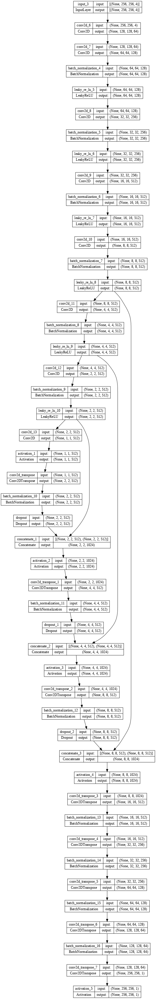

In [15]:
in_image_shape = (256,256,4)
g_model = define_generator(in_image_shape)
tf.keras.utils.plot_model(g_model, show_shapes=True, dpi=64)

In [10]:
g_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 4  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  4160        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 64, 64, 128)  131200      ['conv2d[0][0]']                 
                                                                                              

In [16]:
# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model, image_shape):
  # make weights in the discriminator not trainable
  for layer in d_model.layers:
    if not isinstance(layer, BatchNormalization):
      layer.trainable = False
  # define the source image shape
  in_src = Input(shape=image_shape)
  # connect the source image to the generator input
  gen_out = g_model(in_src)
  # connect the source input and generator output to the discriminator input
  dis_out = d_model([in_src, gen_out])
  # src image as input, generated image and classification output
  model = Model(in_src, [dis_out, gen_out])
  # compile model
  opt = Adam()
  model.compile(loss=['binary_crossentropy', 'mae'], optimizer=opt)
  return model

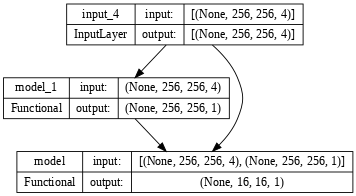

In [17]:
gan = define_gan(g_model, d_model, in_image_shape)
tf.keras.utils.plot_model(gan, show_shapes=True, dpi=64)

In [ ]:
# select a batch of random samples, returns images and target
def generate_real_samples(dataset, n_samples, patch_shape):
  # unpack dataset
  trainA, trainB = dataset
  # choose random instances
  ix = randint(0, trainA.shape[0], n_samples)
  # retrieve selected images
  X1, X2 = trainA[ix], trainB[ix]
  # generate 'real' class labels (1)
  y = ones((n_samples, patch_shape, patch_shape, 1))
  return [X1, X2], y

In [ ]:
# generate a batch of images, returns images and targets
def generate_fake_samples(g_model, samples, patch_shape):
  # generate fake instance
  X = g_model.predict(samples)
  # create 'fake' class labels (0)
  y = zeros((len(X), patch_shape, patch_shape, 1))
  return X, y

In [ ]:
from matplotlib import pyplot
# generate samples and save as a plot and save the model
def summarize_performance(step, g_model, dataset, n_samples=3):
  # select a sample of input images
  [X_realA, X_realB], _ = generate_real_samples(dataset, n_samples, 1)
  # generate a batch of fake samples
  X_fakeB, _ = generate_fake_samples(g_model, X_realA, 1)

  # plot real source images
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1 + i)
    pyplot.axis('off')
    pyplot.title('Original image')
    pyplot.imshow(X_realA[i], cmap = 'gray')
  # plot generated target image
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1 + n_samples + i)
    pyplot.axis('off')
    pyplot.title('Predicted image')
    pyplot.imshow(X_fakeB[i].reshape((256, 256)), cmap = 'gray')
  # plot real target image
  for i in range(n_samples):
    pyplot.subplot(3, n_samples, 1 + n_samples*2 + i)
    pyplot.axis('off')
    pyplot.title('Ground Truth')
    pyplot.imshow(X_realB[i].reshape((256, 256)), cmap = 'gray')

  # save plot to file
  model_id = 'GAN_Pix2Pix_100e_4b_256_10000'
  filename1 = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/GAN_Pix2Pix/Imagenes/' + model_id + '_%05d.png' % (step+1)
  pyplot.savefig(filename1)
  pyplot.close()

  # save the generator model
  filename2 = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/GAN_Pix2Pix/' + model_id + '_%05d.h5' % (step+1)
  g_model.save(filename2)
  print('>Saved: %s and %s' % (filename1.split('/')[-1], filename2.split('/')[-1]))

In [8]:
model.summary()

NameError: ignored

In [ ]:
def train(d_model, g_model, gan_model, dataset, n_epochs=100, n_batch=4):
  # determine the output square shape of the discriminator
  n_patch = d_model.output_shape[1]
  # unpack dataset
  trainA, trainB = dataset
  # calculate the number of batches per training epoch
  bat_per_epo = int(len(trainA) / n_batch)
  # calculate the number of training iterations
  n_steps = bat_per_epo * n_epochs
  # manually enumerate epochs
  for i in range(n_steps):
    # select a batch of real samples
    [X_realA, X_realB], y_real = generate_real_samples(dataset, n_batch, n_patch)
    # generate a batch of fake samples
    X_fakeB, y_fake = generate_fake_samples(g_model, X_realA, n_patch)
    # update discriminator for real samples
    d_loss1 = d_model.train_on_batch([X_realA, X_realB], y_real)
    # update discriminator for generated samples
    d_loss2 = d_model.train_on_batch([X_realA, X_fakeB], y_fake)
    # update the generator
    g_loss, _, _ = gan_model.train_on_batch(X_realA, [y_real, X_realB])
    # summarize performance
    print('step: %d, disc_true: [%.6f], disc_false: [%.6f],  gen: [%.6f]' % (i+1, d_loss1, d_loss2, g_loss))
    # summarize model performance
    if (i+1) % (bat_per_epo * 10) == 0:
      summarize_performance(i, g_model, dataset)

In [ ]:
# load image data
print('Loaded', S_train.shape, P_train.shape)
# define input shape based on the loaded dataset
in_image_shape = S_train.shape[1:]
out_image_shape = (256, 256, 1)
# define the models
d_model = define_discriminator(in_image_shape, out_image_shape)
g_model = tf.keras.models.load_model('/content/drive/My Drive/Tesis/Desarrollo/Modelos/GAN_Pix2Pix/GAN_Pix2Pix_100e_4b_256_10000_05000.h5', compile = False)
# define the composite model
gan_model = define_gan(g_model, d_model, in_image_shape)

Loaded (2000, 256, 256, 4) (2000, 256, 256, 1)


/usr/local/lib/python3.8/dist-packages/keras/initializers/initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [ ]:
# load image data
print('Loaded', S_train.shape, P_train.shape)
# define input shape based on the loaded dataset
in_image_shape = S_train.shape[1:]
out_image_shape = (256, 256, 1)
# define the models
d_model = define_discriminator(in_image_shape, out_image_shape)
g_model = tf.keras.models.load_model('/content/drive/My Drive/Tesis/Desarrollo/Modelos/GAN_Pix2Pix/GAN_Pix2Pix_100e_4b_256_2000.h5', compile = False)
# define the composite model
gan_model = define_gan(g_model, d_model, in_image_shape)
# train model
dataset = [S_train, P_train]
train(d_model, g_model, gan_model, dataset)

In [ ]:
# load image data
print('Loaded', S_train.shape, P_train.shape)
# define input shape based on the loaded dataset
in_image_shape = S_train.shape[1:]
out_image_shape = (256, 256, 1)
# define the models
d_model = define_discriminator(in_image_shape, out_image_shape)
g_model = define_generator(in_image_shape)
# define the composite model
gan_model = define_gan(g_model, d_model, in_image_shape)
# train model
dataset = [S_train, P_train]
train(d_model, g_model, gan_model, dataset)

In [18]:
model = g_model

In [19]:
model.compile(loss='mse', optimizer='adam')

In [20]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 4  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 128, 128, 64  4160        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_7 (Conv2D)              (None, 64, 64, 128)  131200      ['conv2d_6[0][0]']               
                                                                                            

## **Funciones para mostrar resultados**

In [ ]:
min = h5py.File(base_dir + 'DatasetsMin.hdf5', 'r')
max = h5py.File(base_dir + 'DatasetsMax.hdf5', 'r')

min_in = np.array(min.get('S_train'))
min_out = np.array(min.get('P_train'))
print('DatasetMin cargado.')

max_in = np.array(max.get('S_train'))
max_out = np.array(max.get('P_train'))
print('DatasetMax cargado.')

print(min_in.shape, min_out.shape, max_in.shape, max_out.shape)

DatasetMin cargado.
DatasetMax cargado.
(504, 256, 256, 4) (504, 256, 256) (504, 256, 256, 4) (504, 256, 256)


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def loss_plot(history):
  loss = history.history['loss']
  epochs = np.arange(0, len(loss), 1)
  plt.plot(epochs, loss)
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.title("Epochs vs. Loss")
  plt.yscale("log")
  plt.grid()
  plt.show

In [ ]:
def overf_plot(history):
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Loss vs. epochs')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.yscale("log")
  plt.legend(['Training', 'Validation'], loc='upper right')
  plt.show()

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.pyplot as plt
def plot(*argv, titles=None):
  """
  plots a given number of phase maps
  """
  if len(argv) == 1:
    f, ax = plt.subplots(1, 1, sharey=True, figsize=(5, 5))
    if titles is not None:
      ax.set_title(titles)
    a = ax.imshow(argv[0].squeeze(), cmap='gray')
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    f.colorbar(a, cax=cax)
    plt.show()
  else:
    f, axes = plt.subplots(1, len(argv), sharey=True, figsize=(10, 10))
    for i in range(len(argv)):
        if titles is not None:
          axes[i].set_title(titles[i])
        a = axes[i].imshow(argv[i].squeeze(), cmap='gray')
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        f.colorbar(a, cax=cax)
    plt.show()
    f.colorbar(a, cax=cax)

In [ ]:
def plot_hist(*argv, titles):
  """
  plots the historgram of the input phase maps
  """
  for i in range(len(argv)):
      hist = np.histogram(argv[i].ravel(), bins=100)
      plt.plot(hist[1][1:], hist[0])
  plt.xlabel("phase values")
  plt.ylabel("frequency")
  plt.title("Histogram Analysis")
  plt.grid()
  if titles is not None:
    plt.legend(titles)
  plt.show()

In [21]:
def read_model(model, url, bs):
  model = model
  model.compile(optimizer="adam", loss = 'mse')

  model_path = '/content/drive/My Drive/Tesis/Desarrollo/Modelos/GAN_Pix2Pix/' + url
  model.load_weights(model_path)
  return model


In [ ]:
def show_results(model, url, bs):
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)
  idx = np.random.randint(0, S_test.shape[0])
  print(idx)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(S_test[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(P_test[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

In [ ]:
def show_results_min(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(min_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(min_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(min_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

In [ ]:
def show_results_max(model, url, bs, idx):
  model = read_model(model, url, bs)
  y_pred = model.predict(max_in, batch_size=bs)

  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(max_in[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(max_out[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

## **Resultados de los modelos generados**

In [30]:
model = read_model(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)
y_pred = model.predict(Entradas, batch_size=4)

def show_results(idx):
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))
  ax1.imshow(Entradas[idx], cmap = 'jet')
  ax1.set_title('Imagen 4-stack')
  ax2.imshow(Salidas[idx].reshape(256, 256), cmap = 'gray')
  ax2.set_title('Resultado esperado')
  ax3.imshow(y_pred[idx].reshape(256, 256), cmap = 'gray')
  ax3.set_title('Resultado obtenido')

500/500 [==============================] - 23s 25ms/step


<ipython-input-30-be645385b2bd>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15,15))


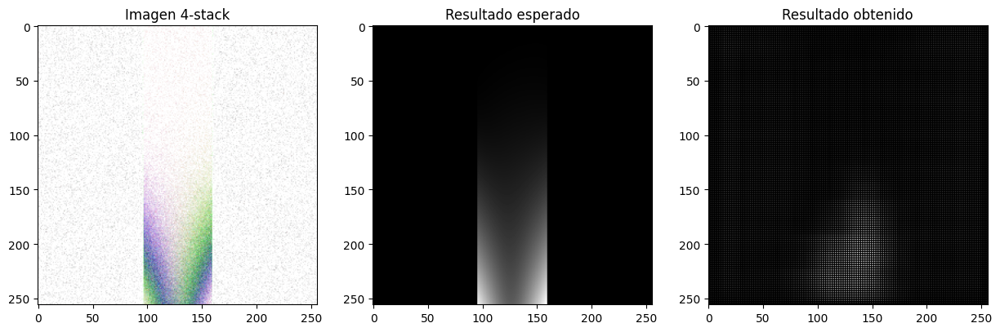

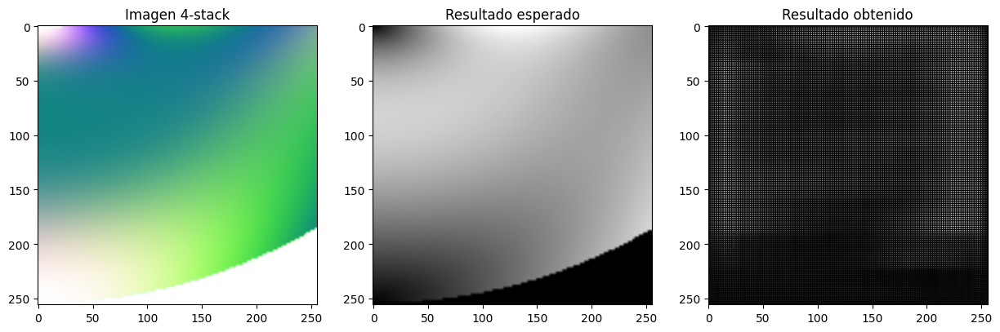

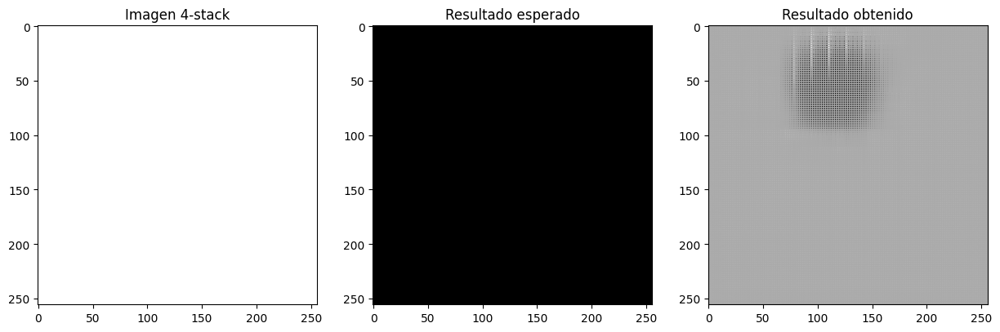

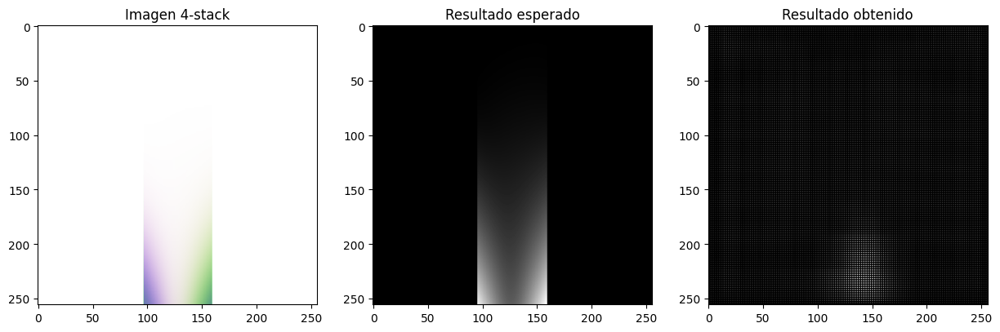

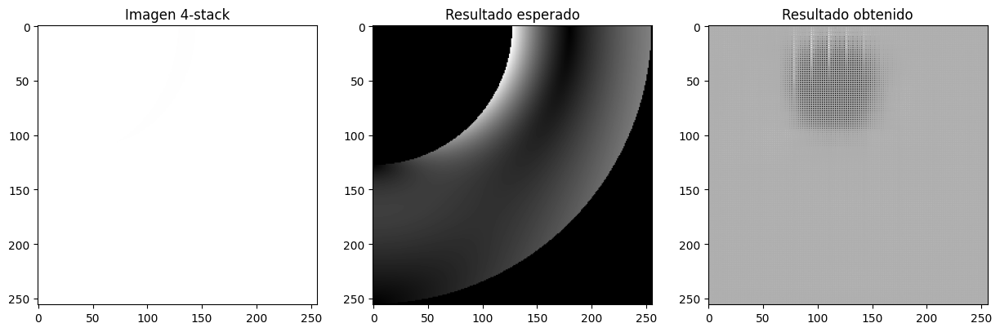

...

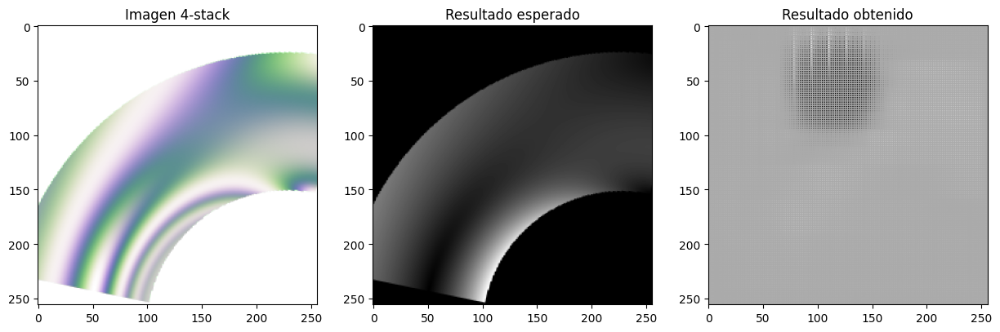

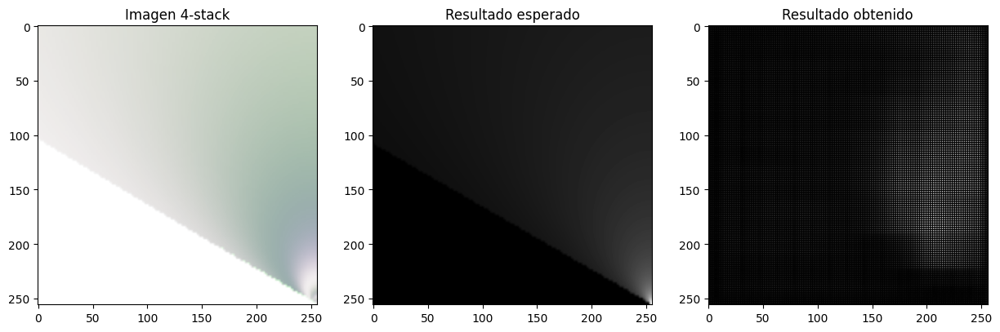

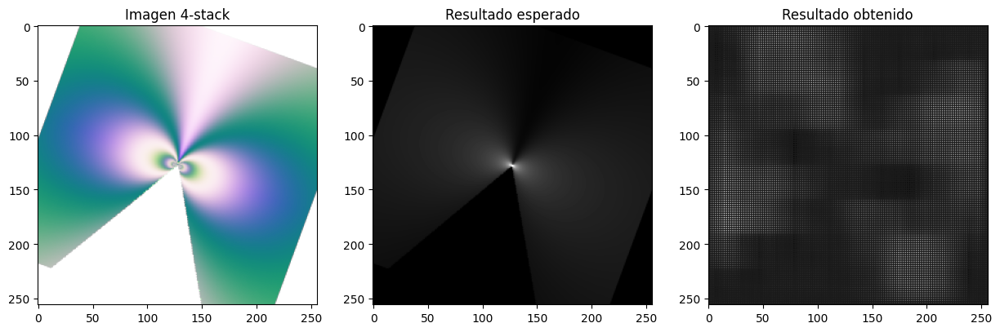

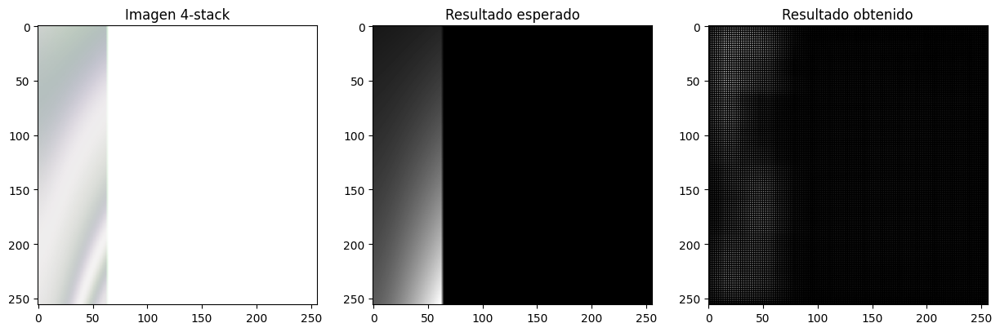

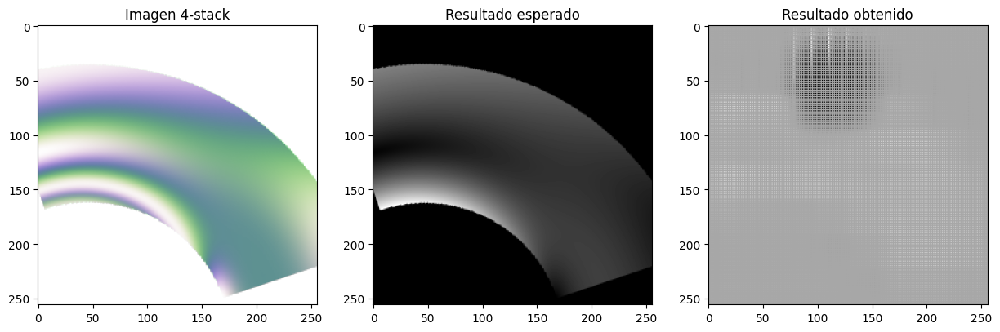

In [32]:
import matplotlib.pyplot as plt

for i in range(30):
  show_results(i)

126/126 [==============================] - 13s 26ms/step


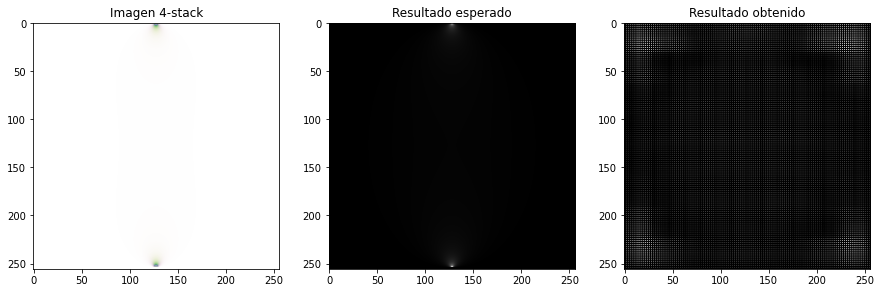

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 0)

126/126 [==============================] - 4s 27ms/step


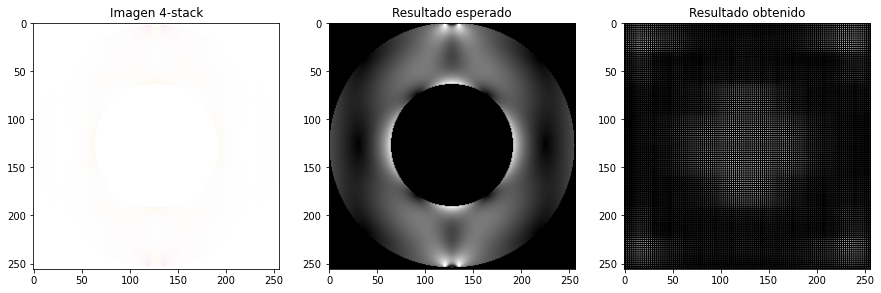

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 100)

126/126 [==============================] - 4s 26ms/step


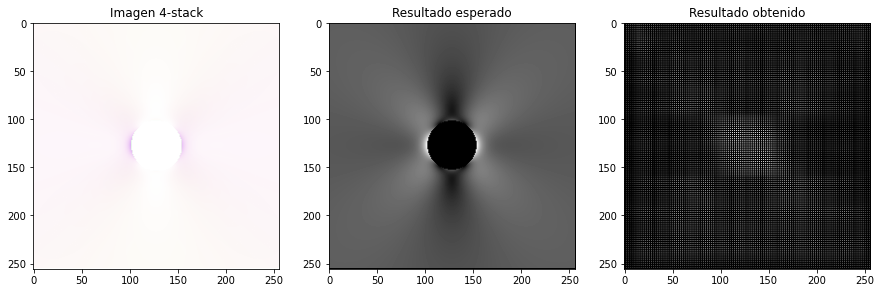

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 200)

126/126 [==============================] - 4s 25ms/step


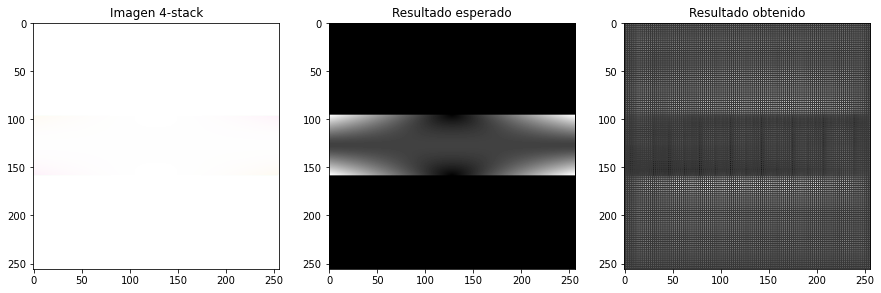

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 300)

126/126 [==============================] - 4s 25ms/step


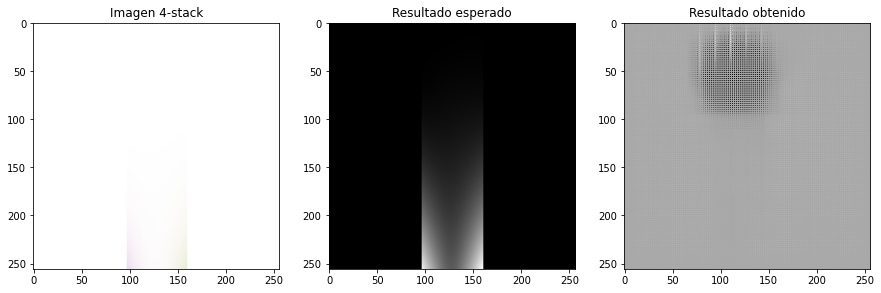

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 400)

126/126 [==============================] - 4s 26ms/step


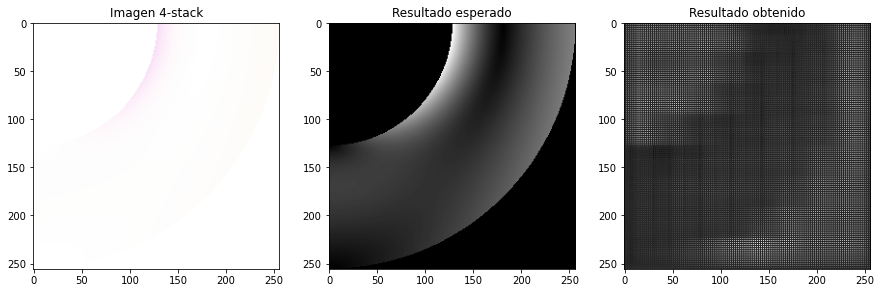

In [ ]:
show_results_min(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 500)

## **Máximo**

126/126 [==============================] - 4s 27ms/step


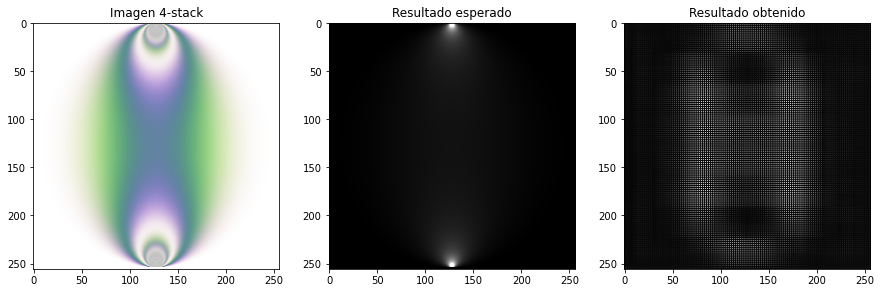

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 0)

126/126 [==============================] - 4s 27ms/step


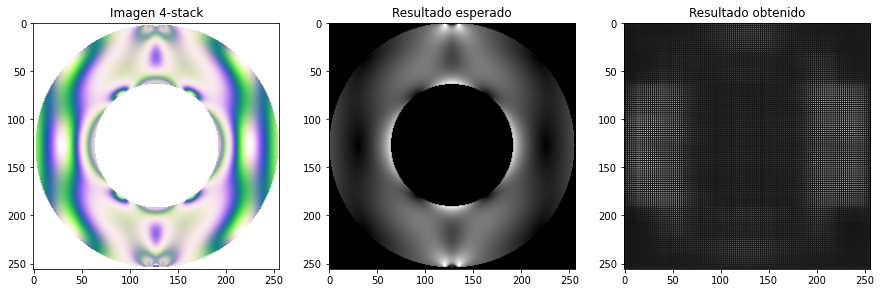

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 100)

126/126 [==============================] - 4s 26ms/step


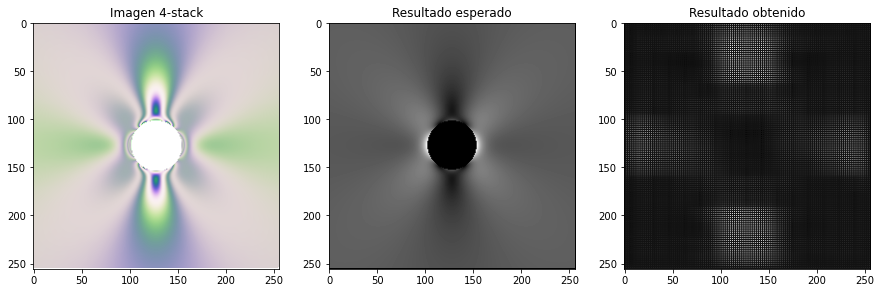

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 200)

126/126 [==============================] - 4s 26ms/step


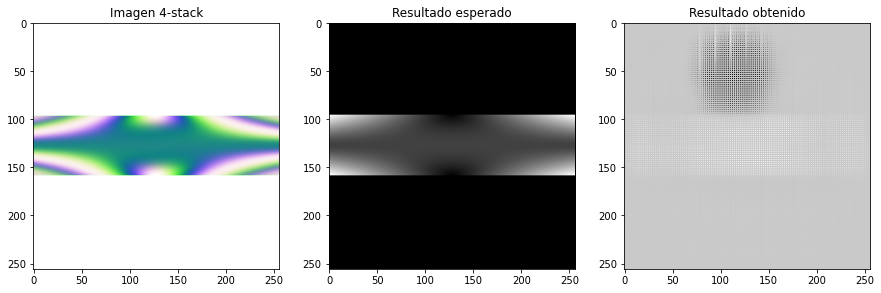

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 300)

126/126 [==============================] - 4s 28ms/step


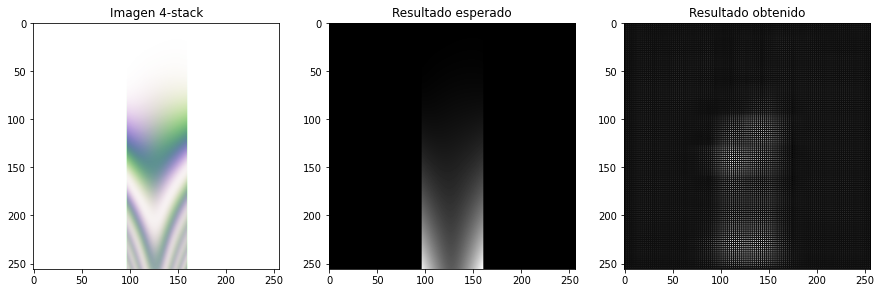

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 400)

126/126 [==============================] - 4s 26ms/step


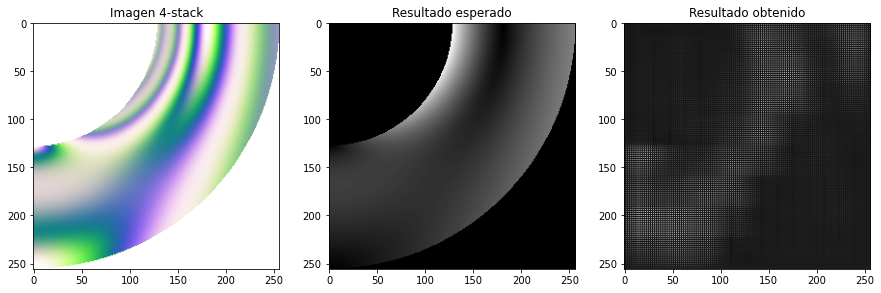

In [ ]:
show_results_max(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4, 500)

**Model8_100e_4b_256_2500**

125/125 [==============================] - 12s 25ms/step
421


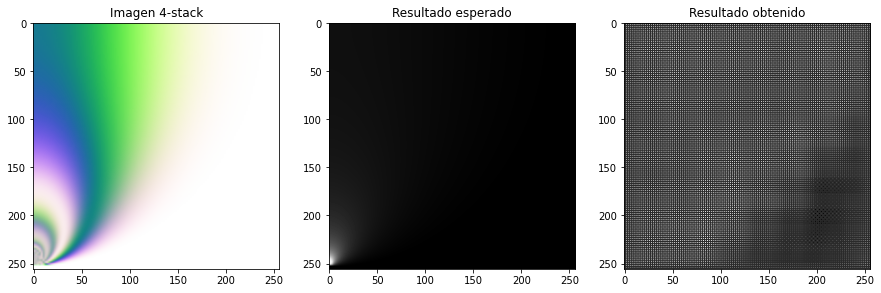

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_2000_05000.h5', 4)

125/125 [==============================] - 4s 26ms/step
105


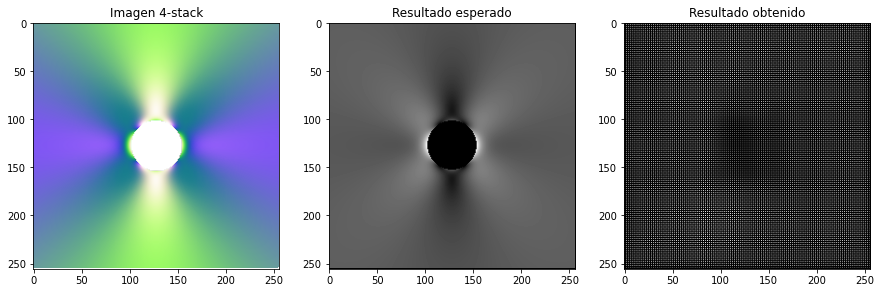

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_2000_05000.h5', 4)

125/125 [==============================] - 4s 27ms/step
467


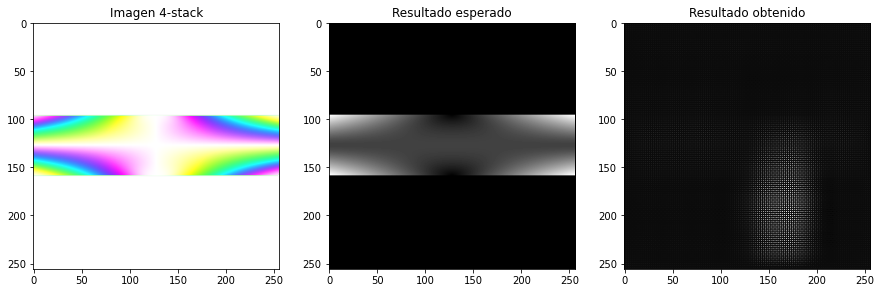

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_2000_05000.h5', 4)

125/125 [==============================] - 4s 26ms/step
252


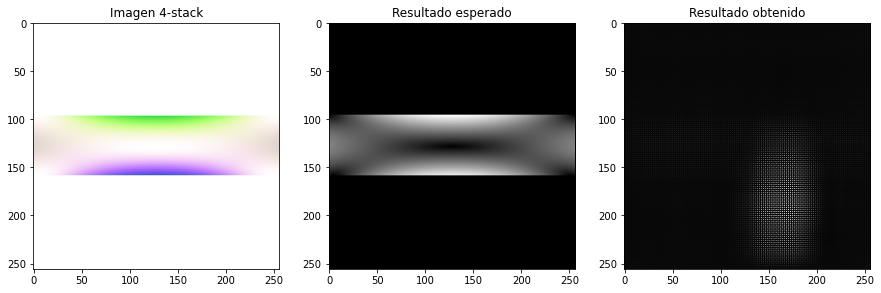

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_2000_05000.h5', 4)

---

**Model8_100e_4b_256_5000**

125/125 [==============================] - 13s 25ms/step
346


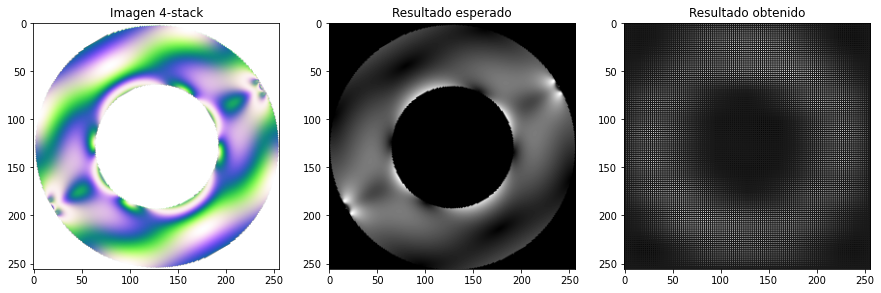

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

125/125 [==============================] - 4s 25ms/step
188


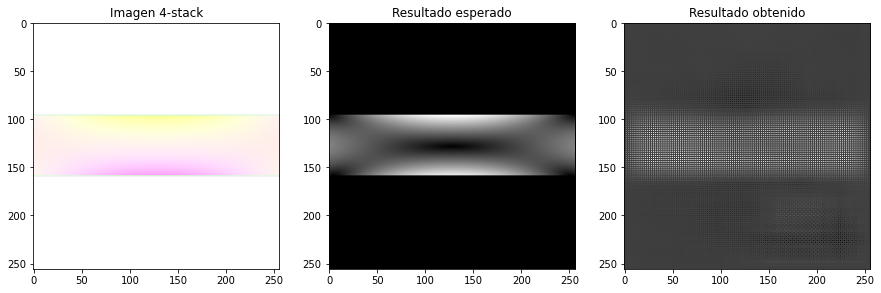

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

125/125 [==============================] - 4s 27ms/step
256


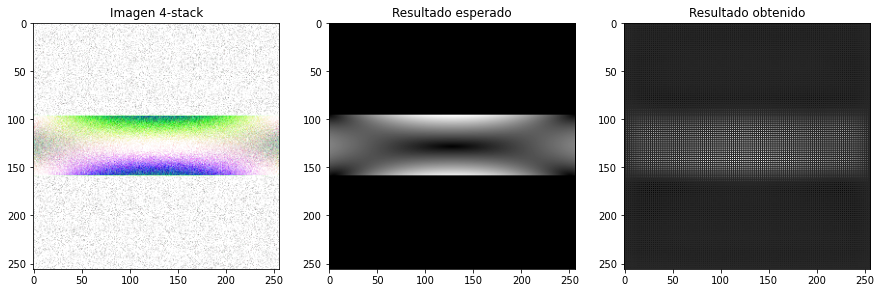

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

125/125 [==============================] - 4s 29ms/step
97


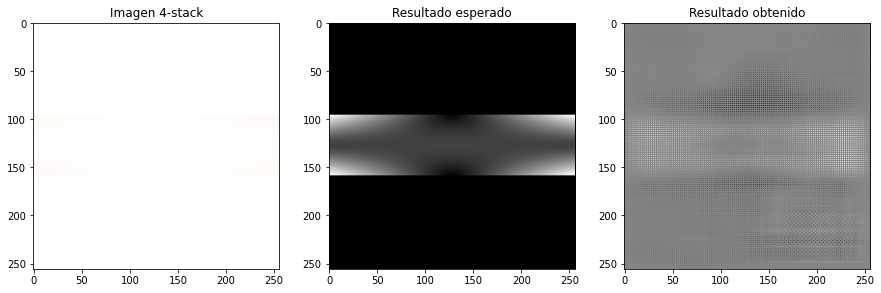

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

125/125 [==============================] - 5s 28ms/step
198


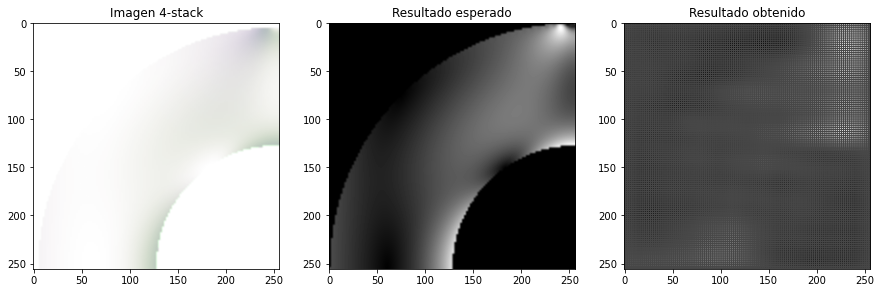

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

---

**Model8_100e_4b_256_7500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_Principales_100e_4b_256_7500.h5', 4)

**Model8_100e_4b_256_10000**

125/125 [==============================] - 4s 26ms/step
6


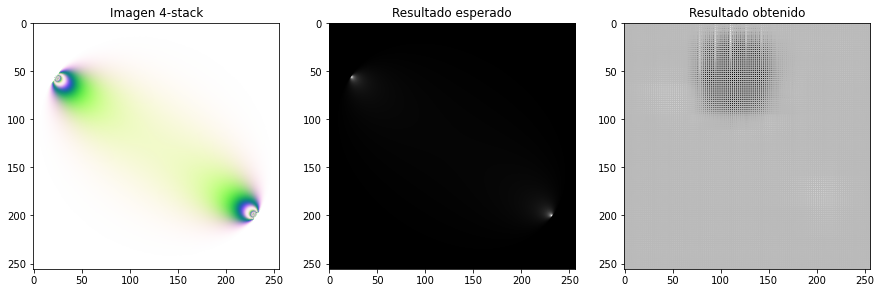

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 28ms/step
330


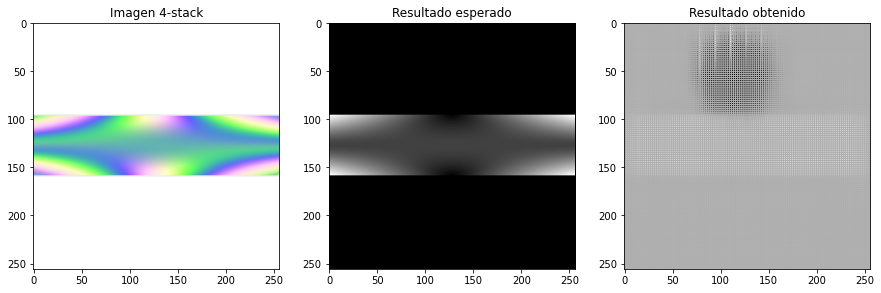

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 28ms/step
198


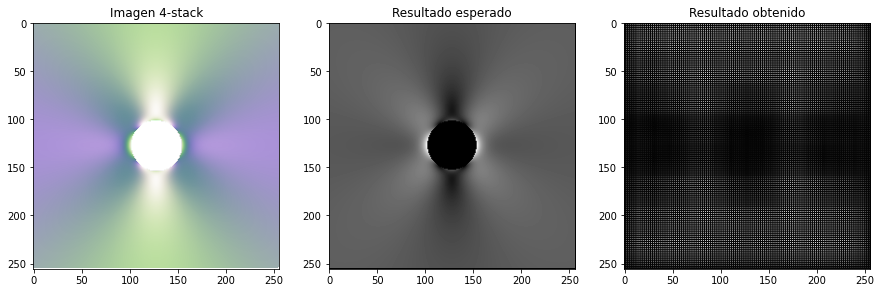

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 26ms/step
321


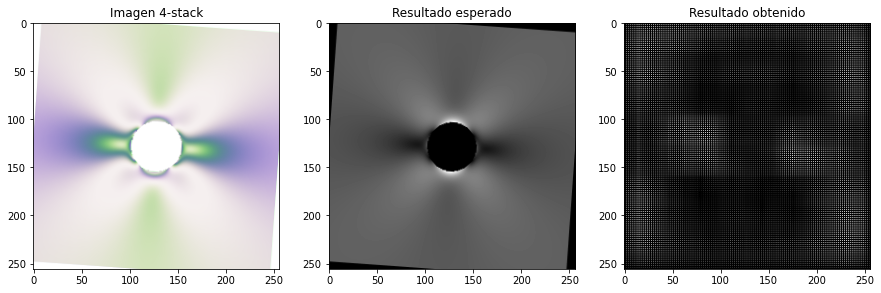

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 27ms/step
324


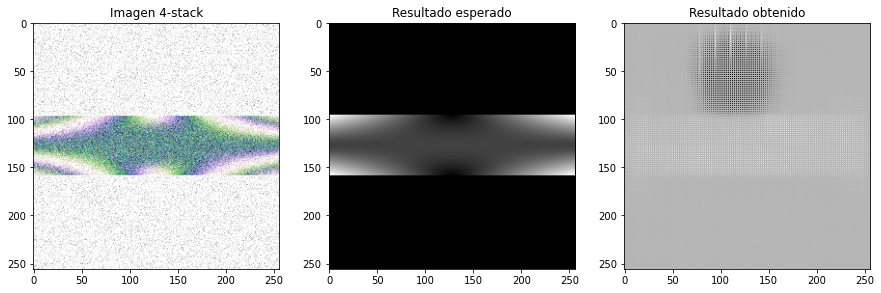

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 26ms/step
12


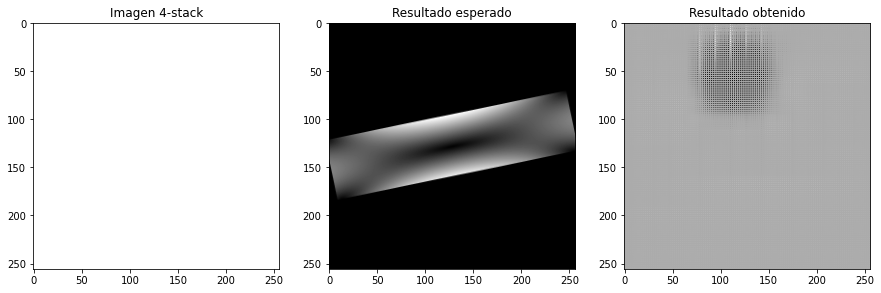

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

125/125 [==============================] - 4s 26ms/step
282


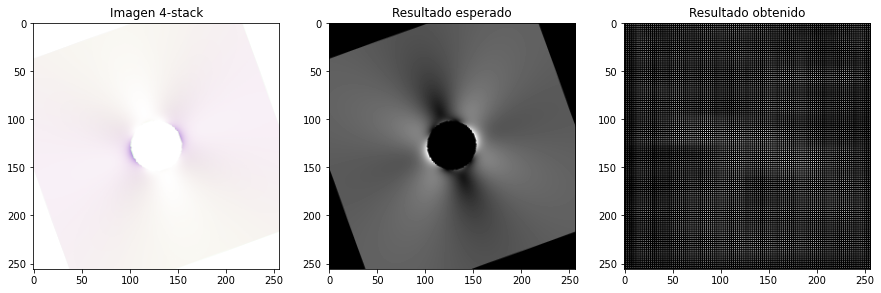

In [ ]:
show_results(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

**Model8_100e_4b_256_12500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_12500.h5', 4)

**Model8_100e_4b_256_15000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

**Model8_100e_4b_256_17500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

**Model8_100e_4b_256_20000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

**Model8_100e_4b_256_22500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

**Model8_100e_4b_256_25000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

**Model8_100e_4b_256_27500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

**Model8_100e_4b_256_30000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

**Model8_100e_4b_256_32500**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

**Model8_100e_4b_256_35000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

**Model8_100e_4b_256_36000**

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

In [ ]:
show_results(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

## **Métricas MSE, SSIM y PSNR Promedio por modelo**

In [ ]:
pip install git+https://github.com/chaofengc/IQA-PyTorch.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/chaofengc/IQA-PyTorch.git to /tmp/pip-req-build-uce3oqp6
  Running command git clone --filter=blob:none --quiet https://github.com/chaofengc/IQA-PyTorch.git /tmp/pip-req-build-uce3oqp6
  Resolved https://github.com/chaofengc/IQA-PyTorch.git to commit 0afec469398488cc97140e7708d8e662c52875b6
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-install-ejx_4naq/clip_c60870875a604e57b40ff2ae34af8d23
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-install-ejx_4naq/clip_c60870875a604e57b40ff2ae34af8d23
  Resolved https://github.com/openai/CLIP.git to commit 3702849800aa56e2223035bccd1c6ef91c704ca8
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 43.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 

In [ ]:
pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pyiqa
import torch

# list all available metrics
print(pyiqa.list_models())

['ahiq', 'brisque', 'ckdn', 'clipiqa', 'clipiqa+', 'cnniqa', 'cw_ssim', 'dbcnn', 'dists', 'fid', 'fsim', 'gmsd', 'ilniqe', 'lpips', 'lpips-vgg', 'mad', 'maniqa', 'ms_ssim', 'musiq', 'musiq-ava', 'musiq-koniq', 'musiq-paq2piq', 'musiq-spaq', 'nima', 'nima-vgg16-ava', 'niqe', 'nlpd', 'nrqm', 'paq2piq', 'pi', 'pieapp', 'psnr', 'psnry', 'ssim', 'ssimc', 'vif', 'vsi']


#### **Función de cómputo de métricas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
import pyiqa
import torch

def metrics(model, url, bs):

  # Llamar métricas
  brisque = pyiqa.create_metric('brisque')
  dbcnn = pyiqa.create_metric('dbcnn')
  nima = pyiqa.create_metric('nima')
  nrqm = pyiqa.create_metric('nrqm')
  ckdn = pyiqa.create_metric('ckdn')
  dists = pyiqa.create_metric('dists')
  lpips = pyiqa.create_metric('lpips')

  # Prediccion
  model = read_model(model, url, bs)
  y_pred = model.predict(S_test, batch_size=bs)

  # ----- Creacion Arrays ------
  # Metricas tradicionales
  mse_array = np.array([])
  ssim_array = np.array([])
  psnr_array = np.array([])

  # Metricas No Reference
  brisque_array = np.array([])
  dbcnn_array = np.array([])
  nima_array = np.array([])
  nrqm_array = np.array([])

  # Metricas Full Reference
  ckdn_array = np.array([])
  dists_array = np.array([])
  lpips_array = np.array([])

  for i in range(S_test.shape[0]):

    #  Nomenclatura resultados
    exp = P_test[i][:,:,0]
    pred = y_pred[i][:,:,0]

    # Procesamiento para metricas de iqa
    new_arr1 = np.expand_dims(y_pred[i], 0)
    new_arr2 = np.expand_dims(P_test[i], 0)
    new_arr1 = new_arr1.reshape((1,1,256,256))
    new_arr2 = new_arr2.reshape((1,1,256,256))
    tensor1 = torch.from_numpy(new_arr1)
    tensor2 = torch.from_numpy(new_arr2)

    # -------------- Calculo de metricas -------------------------
    # Metricas tradicionales
    mse_res = mse(exp, pred)
    ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
    psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

    # Metricas No Reference
    brisque_res = brisque(tensor1).item()
    dbcnn_res = dbcnn(tensor1).item()
    nima_res = nima(tensor1).item()
    nrqm_res = nrqm(tensor1).item()

    # Metricas Full Reference
    ckdn_res = ckdn(tensor1, tensor2).item()
    dists_res = dists(tensor1, tensor2).item()
    lpips_res = lpips(tensor1, tensor2).item()

    # -------------- Almacenamiento de metricas -------------------------
    # Metricas tradicionales
    mse_array = np.append(mse_array, mse_res)
    ssim_array = np.append(ssim_array, ssim_res)
    psnr_array = np.append(psnr_array, psnr_res)

    # Metricas No Reference
    brisque_array = np.append(brisque_array, brisque_res)
    dbcnn_array = np.append(dbcnn_array, dbcnn_res)
    nima_array = np.append(nima_array, nima_res)
    nrqm_array = np.append(nrqm_array, nrqm_res)

    # Metricas Full Reference
    ckdn_array = np.append(ckdn_array, ckdn_res)
    dists_array = np.append(dists_array, dists_res)
    lpips_array = np.append(lpips_array, lpips_res)

    print('\r' + str(i), end='')

  # ----------- Imprimir valores ------------------------
  print('--------Metricas tradicionales----------')
  print('Mean MSE: ' + repr(mse_array.mean()))
  print('Std. Dev MSE: ' + repr(mse_array.std()))
  print('Mean SSIM: ' + repr(ssim_array.mean()))
  print('Std. Dev SSIM: ' + repr(ssim_array.std()))
  print('Mean PSNR: ' + repr(psnr_array.mean()))
  print('Std. Dev PSNR: ' + repr(psnr_array.std()))
  print('--------Metricas No Reference----------')
  print('Mean Brisque: ' + repr(brisque_array.mean()))
  print('Std. Dev Brisque: ' + repr(brisque_array.std()))
  print('Mean DBCNN: ' + repr(dbcnn_array.mean()))
  print('Std. Dev DBCNN: ' + repr(dbcnn_array.std()))
  print('Mean nima: ' + repr(nima_array.mean()))
  print('Std. Dev nima: ' + repr(nima_array.std()))
  print('Mean nrqm: ' + repr(nrqm_array.mean()))
  print('Std. Dev nrqm: ' + repr(nrqm_array.std()))
  print('--------Metricas Full Reference----------')
  print('Mean ckdn: ' + repr(ckdn_array.mean()))
  print('Std. Dev ckdn: ' + repr(ckdn_array.std()))
  print('Mean dists: ' + repr(dists_array.mean()))
  print('Std. Dev dists: ' + repr(dists_array.std()))
  print('Mean lpips: ' + repr(lpips_array.mean()))
  print('Std. Dev lpips: ' + repr(lpips_array.std()))

  #Show one example
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Original image
  mse_none = mse(exp, exp)
  ssim_none = ssim(exp, exp, data_range=exp.max() - exp.min())
  psnr_none = psnr(exp, exp, data_range=exp.max() - exp.min())
  #Result image
  ssim_res = ssim(exp, pred, data_range=pred.max() - pred.min())
  psnr_res = psnr(exp, pred, data_range=pred.max() - pred.min())

  ax[0].imshow(exp, cmap='gray')
  ax[0].set_xlabel(f'MSE: {mse_none:.2f}, SSIM: {ssim_none:.7f}, PSNR: {psnr_none:.2f}')
  ax[0].set_title('Expected image')

  ax[1].imshow(pred, cmap='gray')
  ax[1].set_xlabel(f'MSE: {mse_res:.8f}, SSIM: {ssim_res:.2f}, PSNR: {psnr_res:.2f}')
  ax[1].set_title('Result image')

  plt.tight_layout()
  plt.show()

  return mse_array.mean(), mse_array.std(), ssim_array.mean(), ssim_array.std(), psnr_array.mean(), psnr_array.std(), brisque_array.mean(), brisque_array.std(), dbcnn_array.mean(), dbcnn_array.std(), nima_array.mean(), nima_array.std(), nrqm_array.mean(), nrqm_array.std(), ckdn_array.mean(), ckdn_array.std(), dists_array.mean(), dists_array.std(), lpips_array.mean(), lpips_array.std()

#### **Model8_100e_4b_256_2000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 4s 26ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.02097463708047344
Std. Dev MSE: 0.026531329166891406
Mean SSIM: 0.07671398783115063
Std. Dev SSIM: 0.11636743996104915
Mean PSNR: 5.284883291568762
Std. Dev PSNR: 9.776567354990028
--------Metricas No Reference----------
Mean Brisque: 157.4518612060547
Std. Dev Brisque: 10.67377727197783
Mean DBCNN: 44.4451641998291
Std. Dev DBCNN: 1.342931519783347
Mean nima: 2.902908906459808
Std. Dev nima: 0.17489540460630257
Mean nrqm: 2.7513301482200623
Std. Dev nrqm: 0.07391099898411596
--------Metricas Full Reference----------
Mean ckdn: 0.5022578710913658
Std. Dev ckdn: 0.0494403007536441
Mean dists: 0.5250786645412445
Std. Dev dists: 0.09234480890415818
Mean lpips: 0.3924082079604268
Std. Dev lpips: 0.19245178743806093


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


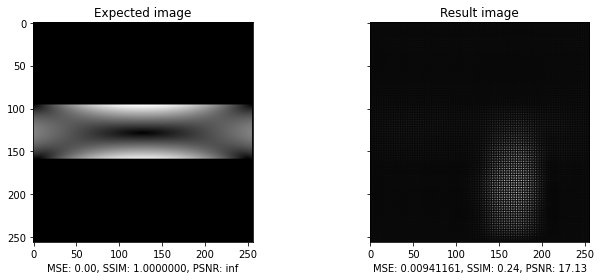

In [ ]:
metrics2000 = metrics(model, 'GAN_Pix2Pix_100e_4b_256_2000_05000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics2000).T
df.columns = cs
df.to_excel('MetricasGAN_Pix2Pix_2000.xlsx')

**Model8_100e_4b_256_4000**

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth
Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 4s 26ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.01674368135272939
Std. Dev MSE: 0.021344540183412978
Mean SSIM: 0.0756308289651723
Std. Dev SSIM: 0.07176190797043479
Mean PSNR: 7.129444947544461
Std. Dev PSNR: 7.074563765113538
--------Metricas No Reference----------
Mean Brisque: 162.01612701416016
Std. Dev Brisque: 18.664882620982503
Mean DBCNN: 42.37401016998291
Std. Dev DBCNN: 2.243133606937762
Mean nima: 2.7851049919128417
Std. Dev nima: 0.14924196577586288
Mean nrqm: 2.7543431992530825
Std. Dev nrqm: 0.05750193069483394
--------Metricas Full Reference----------
Mean ckdn: 0.49807404714822767
Std. Dev ckdn: 0.046139697269850066
Mean dists: 0.4551089743375778
Std. Dev dists: 0.12129095082459797
Mean lpips: 0.39443408290669324
Std. Dev lpips: 0.19462859994094


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


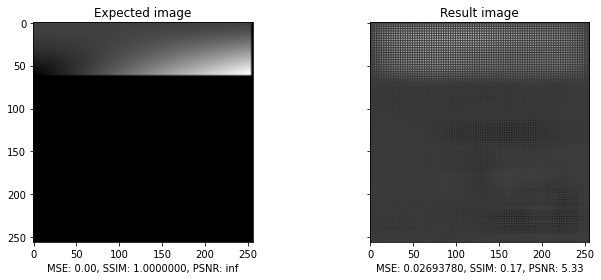

In [ ]:
metrics4000 = metrics(model, 'GAN_Pix2Pix_100e_4b_256_4000_05000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics4000).T
df.columns = cs
df.to_excel('MetricasGAN_Pix2Pix_4000.xlsx')

**Model8_100e_4b_256_6000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 13s 26ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.01719301575962623
Std. Dev MSE: 0.01405276098729711
Mean SSIM: 0.08959400926082364
Std. Dev SSIM: 0.07026298663113058
Mean PSNR: 12.484685404017869
Std. Dev PSNR: 5.7351547167181405
--------Metricas No Reference----------
Mean Brisque: 151.89751333618165
Std. Dev Brisque: 5.762326587000742
Mean DBCNN: 46.56016268920899
Std. Dev DBCNN: 0.6172730493649303
Mean nima: 3.5597090926170347
Std. Dev nima: 0.34864986171603535
Mean nrqm: 3.0767438611984255
Std. Dev nrqm: 0.3339436404613543
--------Metricas Full Reference----------
Mean ckdn: 0.4438047794699669
Std. Dev ckdn: 0.050389911297978644
Mean dists: 0.5240087373256683
Std. Dev dists: 0.06519318642942161
Mean lpips: 0.6392956819534302
Std. Dev lpips: 0.09252151053279706


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


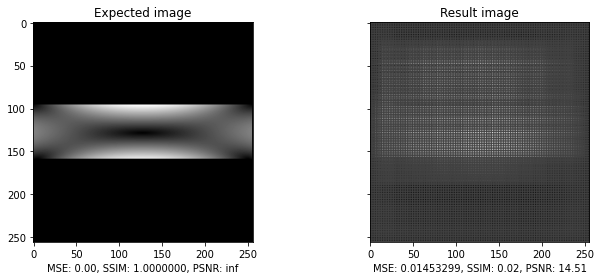

In [ ]:
metrics6000 = metrics(model, 'GAN_Pix2Pix_100e_4b_256_6000_15000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics6000).T
df.columns = cs
df.to_excel('MetricasGAN_Pix2Pix_6000.xlsx')

**Model8_100e_4b_256_8000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 12s 24ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.018311096761262788
Std. Dev MSE: 0.020858726776047883
Mean SSIM: 0.2505307140690285
Std. Dev SSIM: 0.21936080529958113
Mean PSNR: 14.335863393941663
Std. Dev PSNR: 8.258915993626596
--------Metricas No Reference----------
Mean Brisque: 155.42605941772462
Std. Dev Brisque: 20.98838580551819
Mean DBCNN: 44.69605401611328
Std. Dev DBCNN: 2.2970882209646946
Mean nima: 3.581413335323334
Std. Dev nima: 1.0696445835218522
Mean nrqm: 2.985662446975708
Std. Dev nrqm: 0.3569881586964007
--------Metricas Full Reference----------
Mean ckdn: 0.47071347892284393
Std. Dev ckdn: 0.05428088718456071
Mean dists: 0.4705045213699341
Std. Dev dists: 0.09935584489775078
Mean lpips: 0.45443165193125606
Std. Dev lpips: 0.18045646003787574


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


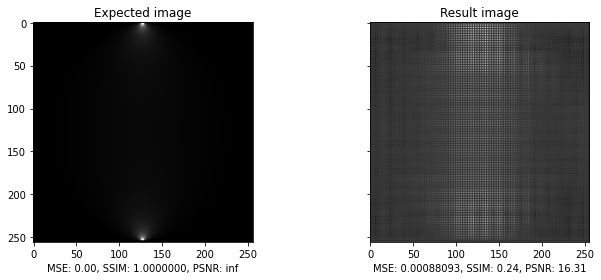

In [ ]:
metrics8000 = metrics(model, 'GAN_Pix2Pix_100e_4b_256_8000_15000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics8000).T
df.columns = cs
df.to_excel('MetricasGAN_Pix2Pix_8000.xlsx')

**Model8_100e_4b_256_10000**

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/brisque_svm_weights.pth" to /root/.cache/torch/hub/checkpoints/brisque_svm_weights.pth



  0%|          | 0.00/112k [00:00<?, ?B/s]

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DBCNN_KonIQ10k-254e8241.pth" to /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth



  0%|          | 0.00/58.4M [00:00<?, ?B/s]

Loading pretrained model DBCNN from /root/.cache/torch/hub/checkpoints/DBCNN_KonIQ10k-254e8241.pth


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/hub/checkpoints/inception_resnet_v2-940b1cd6.pth


Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NIMA_InceptionV2_ava-b0c77c00.pth" to /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth



  0%|          | 0.00/208M [00:00<?, ?B/s]

Loading pretrained model NIMA from /root/.cache/torch/hub/checkpoints/NIMA_InceptionV2_ava-b0c77c00.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/NRQM_model.mat" to /root/.cache/torch/hub/checkpoints/NRQM_model.mat



  0%|          | 0.00/66.2M [00:00<?, ?B/s]

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/CKDN_model_best-38b27dc6.pth" to /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth



  0%|          | 0.00/51.2M [00:00<?, ?B/s]

Loading pretrained model CKDN from /root/.cache/torch/hub/checkpoints/CKDN_model_best-38b27dc6.pth
Downloading: "https://github.com/chaofengc/IQA-PyTorch/releases/download/v0.1-weights/DISTS_weights-f5e65c96.pth" to /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth



  0%|          | 0.00/12.0k [00:00<?, ?B/s]

Loading pretrained model DISTS from /root/.cache/torch/hub/checkpoints/DISTS_weights-f5e65c96.pth


/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://github.com/chaofengc/IQA-Toolbox-Python/releases/download/v0.1-weights/LPIPS_v0.1_alex-df73285e.pth" to /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth



  0%|          | 0.00/5.87k [00:00<?, ?B/s]

Loading pretrained model LPIPS from /root/.cache/torch/hub/checkpoints/LPIPS_v0.1_alex-df73285e.pth
125/125 [==============================] - 4s 26ms/step
499--------Metricas tradicionales----------
Mean MSE: 0.023195838032566245
Std. Dev MSE: 0.025260545971911904
Mean SSIM: 0.03237450302054005
Std. Dev SSIM: 0.11570886839262255
Mean PSNR: 9.387857812147933
Std. Dev PSNR: 7.749744401957622
--------Metricas No Reference----------
Mean Brisque: 155.0561564025879
Std. Dev Brisque: 5.453150044785728
Mean DBCNN: 45.528438507080075
Std. Dev DBCNN: 2.3663787731732633
Mean nima: 3.0812373781204223
Std. Dev nima: 0.6289285389038447
Mean nrqm: 2.9184717683792116
Std. Dev nrqm: 0.2674105295647842
--------Metricas Full Reference----------
Mean ckdn: 0.5101556574702263
Std. Dev ckdn: 0.04245991646073717
Mean dists: 0.5509770203828812
Std. Dev dists: 0.07226782829333626
Mean lpips: 0.4401983588077128
Std. Dev lpips: 0.17766971451499886


/usr/local/lib/python3.8/dist-packages/skimage/metrics/simple_metrics.py:160: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


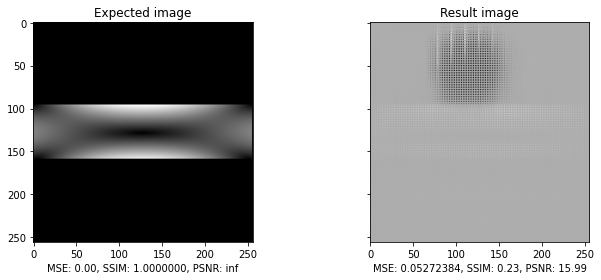

In [ ]:
metrics10000 = metrics(model, 'GAN_Pix2Pix_100e_4b_256_10000_05000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics10000).T
df.columns = cs
df.to_excel('MetricasGAN_Pix2Pix_10000.xlsx')

**Model8_100e_4b_256_15000**

In [ ]:
metrics15000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_15000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics15000).T
df.columns = cs
df.to_excel('MetricasStressNet4_15000.xlsx')

**Model8_100e_4b_256_17500**

In [ ]:
metrics17500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_17500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics17500).T
df.columns = cs
df.to_excel('MetricasStressNet4_17500.xlsx')

**Model8_100e_4b_256_20000**

In [ ]:
metrics20000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_20000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics20000).T
df.columns = cs
df.to_excel('MetricasStressNet4_20000.xlsx')

**Model8_100e_4b_256_22500**

In [ ]:
metrics22500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_22500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics22500).T
df.columns = cs
df.to_excel('MetricasStressNet4_22500.xlsx')

**Model8_100e_4b_256_25000**

In [ ]:
metrics25000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_25000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics25000).T
df.columns = cs
df.to_excel('MetricasStressNet4_25000.xlsx')

**Model8_100e_4b_256_27500**

In [ ]:
metrics27500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_27500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics27500).T
df.columns = cs
df.to_excel('MetricasStressNet4_27500.xlsx')

**Model8_100e_4b_256_30000**

In [ ]:
metrics30000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_30000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics30000).T
df.columns = cs
df.to_excel('MetricasStressNet4_30000.xlsx')

**Model8_100e_4b_256_32500**

In [ ]:
metrics32500 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_32500.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics32500).T
df.columns = cs
df.to_excel('MetricasStressNet4_32500.xlsx')

**Model8_100e_4b_256_35000**

In [ ]:
metrics35000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_35000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics35000).T
df.columns = cs
df.to_excel('MetricasStressNet4_35000.xlsx')

**Model8_100e_4b_256_36000**

In [ ]:
metrics36000 = metrics(get_stressnet(), 'StressNet4_100e_4b_256_36000.h5', 4)

In [ ]:
import pandas as pd
cs = ['mse_mean', 'mse_std', 'ssim_mean', 'ssim_std', 'psnr_mean', 'psnr_std', 'brisque_mean', 'brisque_std', 'dbcnn_mean', 'dbcnn_std', 'nima_mean', 'nima_std', 'nrqm_mean', 'nrqm_std', 'ckdn_mean', 'ckdn_std', 'dists_mean', 'dists_std', 'lpips_mean', 'lpips_std']
df = pd.DataFrame(data = metrics36000).T
df.columns = cs
df.to_excel('MetricasStressNet4_36000.xlsx')

**Predicción sobre imágenes externas**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

def predict(arq, model_url, bs, image):
  model = read_model(arq, model_url, bs)
  image = np.expand_dims(np.load('/content/drive/My Drive/Tesis/SeleccionJhonatan2/Disco/Stack1234/'+ str(image) + '.npy'), axis=0)
  image = image/255
  pred = model.predict(image, batch_size=bs)
  pred = np.reshape(pred, (256, 256))

  #Show result
  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True, sharey=True)
  ax = axes.ravel()

  #Predicted image
  ax[0].imshow(np.reshape(image,(256,256,4)), cmap='gray')
  ax[0].set_title('Original image')

  #Original image
  ax[1].imshow(pred, cmap='gray')
  ax[1].set_title('Predicted image')

  plt.tight_layout()
  plt.show()

# **Anillo**

**Modelo 2**

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)

---

# **Disco**

**Modelo 2**

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 500)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1000)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 1500)

In [ ]:
predict(get_model2(), 'Model1234_2_100e_4b.h5', 4, 2000)

**Modelo 8**

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 500)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1000)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 1500)

In [ ]:
predict(get_model8(), 'Model1234_8_100e_4b.h5', 4, 2000)